<a href="https://colab.research.google.com/github/Anpopaicoconat/dsp_labs/blob/main/dsp2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# preparing

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1OXZ-7SKtOKZJh6ta1jOocd2ZPLWHRCTZ' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1OXZ-7SKtOKZJh6ta1jOocd2ZPLWHRCTZ" -O audio_train.zip && rm -rf /tmp/cookies.txt
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1wI3rNJ4ii1wkvZ0l5sobKBYJsXPS-hX6' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1wI3rNJ4ii1wkvZ0l5sobKBYJsXPS-hX6" -O train.csv && rm -rf /tmp/cookies.txt
!unzip audio_train.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: train/7e87466d3d15d239c76d.wav  
  inflating: train/4f074423bf80bd1d9ec1.wav  
  inflating: train/fb17cc422d31e33c0361.wav  
  inflating: train/1297b7ce3e2bf0b2616b.wav  
  inflating: train/b8dd1e127150f08839ea.wav  
  inflating: train/1827319165c12ed31c49.wav  
  inflating: train/11207f0d9cc9dca98f66.wav  
  inflating: train/e70e28df5f6589f07807.wav  
  inflating: train/6d73d327ce4a29fd3451.wav  
  inflating: train/94c0253d630bdad083b7.wav  
  inflating: train/44ef27554643b4b7f6f8.wav  
  inflating: train/7a7c6d8286ee27edce5d.wav  
  inflating: train/8b8b98d2c4e333d46428.wav  
  inflating: train/85b4139b61ebde4844e7.wav  
  inflating: train/f1152c89cb45bd58571e.wav  
  inflating: train/78e6efb958ba903c9af8.wav  
  inflating: train/9083a29106e08cb37e6b.wav  
  inflating: train/4d879f084c742ec4ded5.wav  
  inflating: train/016f0dd264b6f65736e3.wav  
  inflating: train/a50b4a1226e84fb7b6f8.wav  
  inflating:

In [ ]:
!pip install librosa
import pandas as pd
import numpy as np
import torch
import os
import random
import librosa
import sklearn
import sklearn.preprocessing
import sklearn.pipeline
import sklearn.svm
import sklearn.feature_extraction
import sklearn.model_selection
import sklearn.decomposition
import sklearn.metrics
import sklearn.manifold
import sklearn.discriminant_analysis
import sklearn.tree
import sklearn.ensemble
import sklearn.naive_bayes
import tqdm
import torchaudio
import torchvision
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import IPython.display as ipd
import pprint

# aed

## conv1d

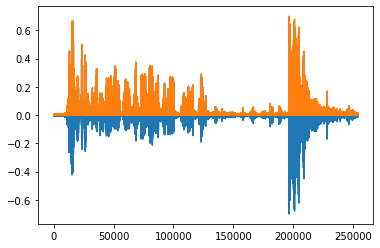

In [ ]:
y, sr = torchaudio.load('/content/Стрельба на улице.wav')
y1 = torch.abs(y)
plt.plot(y[0].numpy())
plt.plot(y1[0].numpy())
ipd.Audio(y, rate=sr)

In [ ]:
y1 = torch.unsqueeze(y1, 0)
y1

tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0054, 0.0047, 0.0047]]])

In [ ]:
conv = torch.nn.Conv1d(in_channels=1, out_channels=1, kernel_size=3000, stride=1, padding='same')
w = torch.hamming_window(conv.weight.size()[-1])/100
w = w.view(conv.weight.size()[0], conv.weight.size()[1], conv.weight.size()[2])
conv.weight = torch.nn.Parameter(w)
conv.bias = torch.nn.Parameter(torch.zeros(conv.bias.size()))

norm = torch.nn.Tanh()

out = conv(y1)
out = norm(out)

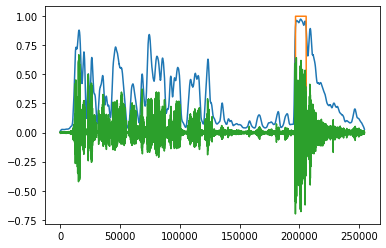

In [ ]:
mask = out[0][0] > 0.90
mask = mask.view(1, 1, -1).type(torch.FloatTensor)
plt.plot(out[0][0].detach().numpy())
plt.plot(mask[0][0].detach().numpy())
plt.plot(y[0].numpy())

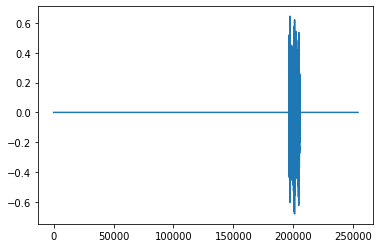

In [ ]:
masked = y[0].numpy()*np.abs(mask[0][0].detach().numpy())
plt.plot(masked)
ipd.Audio(masked, rate=sr)

tensor([[[-1.,  1.]]])


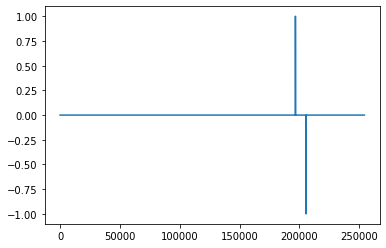

In [ ]:
start_conv = torch.nn.Conv1d(in_channels=1, out_channels=1, kernel_size=2, stride=1, padding='same')
start_conv.bias = torch.nn.Parameter(torch.zeros(conv.bias.size()))
w = torch.ones(start_conv.weight.size())
w[0, 0, 0]=-1
w = w/(w.sum()+1)
print(w)
start_conv.weight = torch.nn.Parameter(w)
edge_points = start_conv(mask)
plt.plot(edge_points[0][0].detach().numpy())

In [ ]:
starts = (edge_points.flatten()==1).nonzero().flatten()
ends = (edge_points.flatten()==-1).nonzero().flatten()
if starts[0] > ends[0]:
    ends = torch.cat([torch.tensor([0]), starts])
if starts[-1] > ends[-1]:
    ends = torch.cat([torch.tensor([mask.size()[-1]]), starts])

for s, e in zip(starts, ends):
    ipd.display(ipd.Audio(y[:, s:e], rate=sr))

## conv2d 

### путь

In [ ]:
win_length = 10000
hop_length = 5000
n_mels = 5
y_kernel = 1

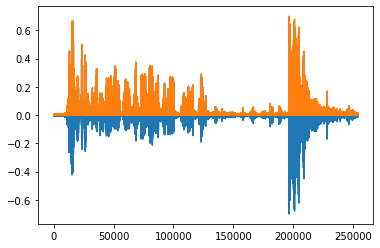

In [ ]:
y, sr = torchaudio.load('/content/Стрельба на улице.wav')
y1 = torch.abs(y)
plt.plot(y[0].numpy())
plt.plot(y1[0].numpy())
ipd.Audio(y, rate=sr)
y = torch.unsqueeze(y, 0)

torch.Size([1, 1, 5, 51])


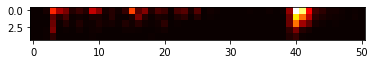

torch.Size([1, 1, 5, 51])


In [ ]:
mfcc = torchaudio.transforms.MelSpectrogram(hop_length=hop_length, n_mels=n_mels, win_length = win_length, n_fft = win_length)
mfcc_out = mfcc(y)
print(mfcc_out.size())
plt.imshow(mfcc_out.detach().numpy()[0][0], cmap='hot')
plt.show()
print(mfcc_out.size())

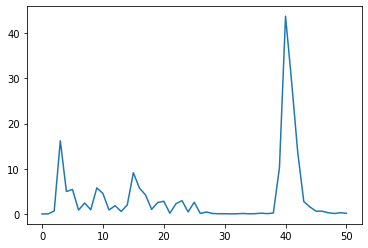

In [ ]:
conv = torch.nn.Conv2d(in_channels=1, out_channels=1, kernel_size=(n_mels, y_kernel), stride=(128, 1), padding=(0, y_kernel//2))
w = (torch.hamming_window(conv.weight.size()[-1])).repeat(n_mels, 1)
w = w.view(list(conv.weight.size()))
conv.weight = torch.nn.Parameter(w)
conv.bias = torch.nn.Parameter(torch.zeros(conv.bias.size()))

#norm = torch.nn.Tanh()

out = conv(mfcc_out)/10000
plt.plot(out.flatten().detach().numpy())

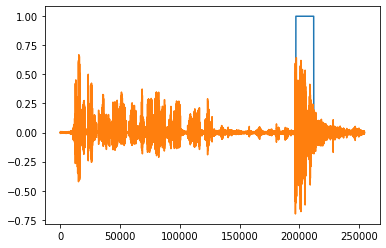

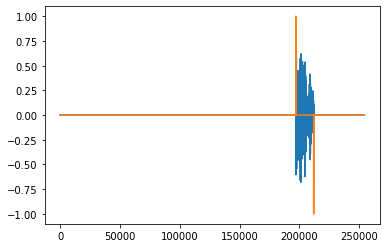

In [ ]:
mask = (out > 20).type(torch.FloatTensor)
#plt.plot(mask[0][0][0].detach().numpy())
scale = torchvision.transforms.Resize((1, y.size()[-1]))
scaled_mask = scale(mask)
scaled_mask = (scaled_mask > 0).type(torch.FloatTensor)
plt.plot(scaled_mask.flatten().numpy())
plt.plot(y.flatten().numpy())
plt.figure()
masked = y.flatten().numpy()*np.abs(scaled_mask.flatten().detach().numpy())
plt.plot(masked)
ipd.Audio(masked, rate=sr)

start_conv = torch.nn.Conv1d(in_channels=1, out_channels=1, kernel_size=2, stride=1, padding='same')
start_conv.bias = torch.nn.Parameter(torch.zeros(conv.bias.size()))
w = torch.ones(start_conv.weight.size())
w[0, 0, 0]=-1
w = w/(w.sum()+1)
start_conv.weight = torch.nn.Parameter(w)
edge_points = start_conv(scaled_mask[0])
plt.plot(edge_points[0][0].detach().numpy())

starts = (edge_points.flatten()==1).nonzero().flatten()
ends = (edge_points.flatten()==-1).nonzero().flatten()
if starts[0] > ends[0]:
    ends = torch.cat([torch.tensor([0]), starts])
if starts[-1] > ends[-1]:
    ends = torch.cat([torch.tensor([mask.size()[-1]]), starts])

for s, e in zip(starts, ends):
    print(y)
    y_for_infer = y[:, s:e], sr
    ipd.display(ipd.Audio(y.flatten()[s:e], rate=sr))

### class

In [ ]:
class conv2d_aed(torch.nn.Module):
    def __init__(self, extractor, kernel_size, stride=(128, 1)):
        super().__init__()
        self.extractor = extractor
        self.conv = torch.nn.Conv2d(in_channels=1, out_channels=1, kernel_size=kernel_size, stride=stride, padding=(0, y_kernel//2))
        w = (torch.hamming_window(self.conv.weight.size()[-1])).repeat(n_mels, 1)
        w = w.view(list(self.conv.weight.size()))
        self.conv.weight = torch.nn.Parameter(w)
        self.conv.bias = torch.nn.Parameter(torch.zeros(conv.bias.size()))
        self.edge_conv = torch.nn.Conv1d(in_channels=1, out_channels=1, kernel_size=2, stride=1, padding='same')
        self.edge_conv.bias = torch.nn.Parameter(torch.zeros(conv.bias.size()))
        w = torch.ones(start_conv.weight.size())
        w[0, 0, 0]=-1
        w = w/(w.sum()+1)
        self.edge_conv.weight = torch.nn.Parameter(w)

    def get_feature(self, y):
        return self.extractor(y)

    def get_curve(self, y, feature=None):
        if feature is None:
            feature = self.extractor(y)
        out = (conv(feature) - conv(feature).min()) / (conv(feature).max()-conv(feature).min())
        scale = torchvision.transforms.Resize((1, y.size()[-1]))
        scaled_out = scale(out)
        return scaled_out

    def get_mask(self, y, curve=None, tresh_hold=0.5):
        if curve is None:
            curve = self.get_curve(y)
        mask = (curve > tresh_hold).type(torch.FloatTensor)
        scale = torchvision.transforms.Resize((1, y.size()[-1]))
        scaled_mask = scale(mask)
        scaled_mask = (scaled_mask > 0).type(torch.FloatTensor)
        return scaled_mask

    def get_edges(self, y=None, mask=None, tresh_hold=0.5):
        if mask is None:
            mask = self.get_mask(y, tresh_hold=tresh_hold)
        edge_points = self.edge_conv(mask[0])
        starts = (edge_points.flatten()==1).nonzero().flatten()
        ends = (edge_points.flatten()==-1).nonzero().flatten()
        if starts[0] > ends[0]:
            ends = torch.cat([torch.tensor([0]), starts])
        if starts[-1] > ends[-1]:
            ends = torch.cat([torch.tensor([mask.size()[-1]]), starts])
        return zip(starts, ends)
    def get_events(self, y, edges=None, tresh_hold=0.5):
        if edges is None:
            edges = self.get_edges(y, tresh_hold=tresh_hold)
        for s, e in edges:
            segment = y[:, :, s:e], sr
            yield segment

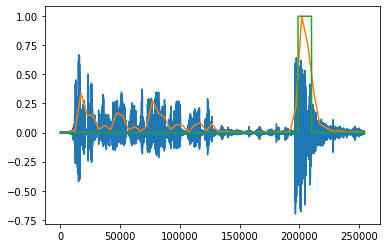

In [ ]:
win_length = 10000
hop_length = 5000
n_mels = 10
y_kernel = 1

mel_extractor = torchaudio.transforms.MelSpectrogram(hop_length=hop_length, 
                                                 n_mels=n_mels, 
                                                 win_length=win_length, 
                                                 n_fft=win_length)

mfcc_extractor = torchaudio.transforms.MFCC(n_mfcc=n_mels, 
                                            log_mels=True,
                                            melkwargs={'hop_length':hop_length, 
                                                       'n_mels':n_mels, 
                                                       'win_length':win_length, 
                                                       'n_fft':win_length})

aed = conv2d_aed(extractor=mel_extractor, kernel_size=(n_mels, y_kernel), stride=(128, 1))

y, sr = torchaudio.load('/content/Стрельба на улице.wav')
y = torch.unsqueeze(y, 0)
plt.plot(y.flatten().detach().numpy())
plt.plot(aed.get_curve(y).flatten().detach().numpy())
plt.plot(aed.get_mask(y, tresh_hold=0.5).flatten().detach().numpy())

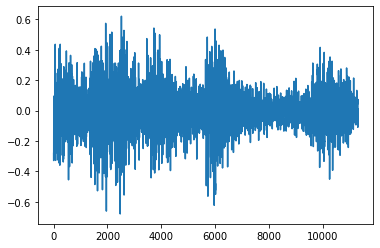

In [ ]:
aed = conv2d_aed(extractor=mel_extractor, kernel_size=(n_mels, y_kernel), stride=(128, 1))
y, sr = torchaudio.load('/content/Стрельба на улице.wav')
y = torch.unsqueeze(y, 0)
events = list(aed.get_events(y, tresh_hold=0.5))[0]
event, sr = events
plt.plot(event.flatten().numpy())
ipd.display(ipd.Audio(event.flatten(), rate=sr))

# cls

In [ ]:
train_csv = pd.read_csv('train.csv')
len(train_csv)

5683

In [ ]:
#@title WavDataset
class WavDataset(torch.utils.data.Dataset):
    def __init__(self, data_dir=None, fnames=None, wavs=None, labels=None, pad_size=False, le=None, extractor=None, aggregator=None, as_numpy=False):
        '''
        data_dir: str - path to dir with .wav files
        fnames: list - every item is name of .wav file in data_dir
        labels: list - labels for files in data_dir in the same order as fnames
        pad_size: 'mean', 'max', 'min' , False or int size for pad and cut if 
                  False do not use padding and truncutting
        le: function to encode labels for lerning
        extractor: function for feature extruction from .wav files
        aggregator: function for aggregation features and reducing dims
        as_numpy: False - using for torch.dataloader, True - for getting np.array
        '''
        super().__init__()
        self.extractor = extractor
        self.aggregator = aggregator
        self.as_numpy = as_numpy
        self.data_dir = data_dir
        self.fnames = fnames
        self.wavs = wavs
        self.labels = labels
        if le and (self.labels is not None):
            self.labels = le.transform(self.labels)
        len_sum = 0
        len_max = 0
        len_min = np.inf
        if self.fnames is not None:
            self.fnames = [os.path.join(self.data_dir, fname) for fname in self.fnames]
            l = self.fnames
        else:
            l = wavs
        for fname in tqdm.tqdm(l):
            if type(fname) is str:
                wav =  torchaudio.load(fname)[0][0]
            else:
                wav = l[0][0]
            len_sum += len(wav)
            if len_max < len(wav):
                len_max = len(wav)
            if len_min > len(wav):
                len_min = len(wav)
        self.len_mean = len_sum/len(l)
        self.len_max = len_max
        self.len_min = len_min
        if pad_size == 'mean':
            self.pad_size = int(self.len_mean)
        elif pad_size == 'max':
            self.pad_size = self.len_max
        elif pad_size == 'max':
            self.pad_size = self.len_min
        else:
            self.pad_size = pad_size

    def __len__(self):
        if self.fnames is not None:
            return len(self.fnames)
        else:
            return len(self.wavs)
    
    def __getitem__(self, idx):
        if self.fnames is not None:
            wav, sr =  torchaudio.load(self.fnames[idx])
        else:
            wav, sr =  self.wavs[idx]
        if self.labels is not None:
            labels = self.labels[idx]
        else:
            labels = []
        if self.pad_size:
            p = (self.pad_size - len(wav.flatten())) // 2 + 1
            if p>0:
                wav =torch.nn.functional.pad(wav, (p, p), value=0.0)
            wav = wav[:, :self.pad_size]
        if self.extractor is not None:
            wav = self.extractor(wav)
        if self.aggregator is not None:
            wav = self.aggregator(wav)
        if self.as_numpy:
            wav = wav.numpy()
            wav = np.append(wav, labels)
            return wav
        else:
            return wav, labels

    def numpy(self):
        self.as_numpy = True
        return np.array(self)

In [ ]:
#@title utilities
data_dir = 'train'
train_csv = pd.read_csv('train.csv')
le = sklearn.preprocessing.LabelEncoder()
le.fit(train_csv['label'].values)
n_classes = len(le.classes_)
win_length = 1000
hop_length = 500
n_mels = 128

mel_extractor = torchaudio.transforms.MelSpectrogram(hop_length=hop_length, 
                                                 n_mels=n_mels, 
                                                 win_length=win_length, 
                                                 n_fft=win_length)

mfcc_extractor = torchaudio.transforms.MFCC(n_mfcc=40, 
                                            log_mels=True,
                                            melkwargs={'hop_length':hop_length, 
                                            'n_mels':n_mels, 
                                            'win_length':win_length, 
                                            'n_fft':win_length})

aggregator = lambda x: torch.mean(x, axis=-1)
data = WavDataset(data_dir=data_dir, fnames=train_csv['fname'], 
                   labels=train_csv['label'], le=le, 
                   extractor=mfcc_extractor, aggregator=aggregator, as_numpy=False)

100%|██████████| 5683/5683 [00:07<00:00, 715.55it/s]


## classic

### learning

In [ ]:
#@title split dataset
def preproc_data(data, train_size=0.5, random_state=42):
    data = data.numpy()
    train, test = sklearn.model_selection.train_test_split(data, train_size=train_size,  random_state=random_state)
    x_train = train[:, :-1]
    y_train = train[:, -1]
    x_test = test[:, :-1]
    y_test = test[:, -1]

    return x_train, y_train, x_test, y_test

In [ ]:
#@title fit model
def fittest_model(model, param_grid, x_train, y_train, x_test, y_test, le):
    grid = sklearn.model_selection.GridSearchCV(model, param_grid, refit=True, verbose=0)
    grid.fit(x_train, y_train)
    print(grid.best_params_)
    y_pred = grid.predict(x_test)
    f1_macro = sklearn.metrics.f1_score(y_test, y_pred, average='macro')
    f1_all = sklearn.metrics.f1_score(y_test, y_pred, average=None)
    acc = sklearn.metrics.accuracy_score(y_test, y_pred)
    precision_macro = sklearn.metrics.precision_score(y_test, y_pred, average='macro')
    precision_all = sklearn.metrics.precision_score(y_test, y_pred, average=None)
    recall_macro = sklearn.metrics.recall_score(y_test, y_pred, average='macro')
    recall_all = sklearn.metrics.recall_score(y_test, y_pred, average=None)

    return grid, {'f1_macro':f1_macro, 'acc':acc, 'precision_macro':precision_macro, 'recall_macro':recall_macro, 
            'all':{k:{'f1':v[0],'recall':v[1], 'precision':v[2]} for k, v in zip(le.classes_, zip( f1_all, recall_all, precision_all))}}

In [ ]:
#@title Mel SVC
data.extractor = mel_extractor
x_train, y_train, x_test, y_test = preproc_data(data)

param_grid = [{'model__C': [0.1, 1, 10],
              'model__gamma': [1, 0.1, 0.01],
              'model__kernel': ['linear', 'poly', 'rbf'],
              'model__decision_function_shape':['ovo', 'ovr']}]

model = sklearn.svm.SVC()
scaler = sklearn.preprocessing.StandardScaler()
model = sklearn.pipeline.Pipeline([('scaler', scaler), ('model', model)])
    
out_model, metric = fittest_model(model, param_grid, x_train, y_train, x_test, y_test, le=le)
pp = pprint.PrettyPrinter(indent=1)
pp.pprint(metric)

{'model__C': 10, 'model__decision_function_shape': 'ovo', 'model__gamma': 1, 'model__kernel': 'poly'}
{'acc': 0.2744546094299789,
 'all': {'Acoustic_guitar': {'f1': 0.38857142857142857,
                             'precision': 0.37777777777777777,
                             'recall': 0.4},
         'Applause': {'f1': 0.525,
                      'precision': 0.4228187919463087,
                      'recall': 0.6923076923076923},
         'Bark': {'f1': 0.217687074829932,
                  'precision': 0.1927710843373494,
                  'recall': 0.25},
         'Bass_drum': {'f1': 0.5,
                       'precision': 0.46875,
                       'recall': 0.5357142857142857},
         'Burping_or_eructation': {'f1': 0.2909090909090909,
                                   'precision': 0.4,
                                   'recall': 0.22857142857142856},
         'Bus': {'f1': 0.05128205128205128,
                 'precision': 0.1111111111111111,
                 'recall':

In [ ]:
#@title MFCC SVC
data.extractor = mfcc_extractor
x_train, y_train, x_test, y_test = preproc_data(data)

param_grid = {'model__C': [0.1, 1, 10],
              'model__gamma': [1, 0.1, 0.01],
              'model__kernel': ['linear', 'poly', 'rbf'],
              'model__decision_function_shape':['ovo', 'ovr']}
model = sklearn.svm.SVC()
scaler = sklearn.preprocessing.StandardScaler()
model = sklearn.pipeline.Pipeline([('scaler', scaler), ('model', model)])

out_model, metric = fittest_model(model, param_grid, x_train, y_train, x_test, y_test, le=le)
pp = pprint.PrettyPrinter(indent=1)
pp.pprint(metric)

{'C': 10, 'decision_function_shape': 'ovo', 'gamma': 0.01, 'kernel': 'rbf'}
{'acc': 0.46481351161154116,
 'all': {'Acoustic_guitar': {'f1': 0.42045454545454547,
                             'precision': 0.4065934065934066,
                             'recall': 0.43529411764705883},
         'Applause': {'f1': 0.7301587301587302,
                      'precision': 0.7040816326530612,
                      'recall': 0.7582417582417582},
         'Bark': {'f1': 0.535031847133758,
                  'precision': 0.45161290322580644,
                  'recall': 0.65625},
         'Bass_drum': {'f1': 0.5217391304347826,
                       'precision': 0.48,
                       'recall': 0.5714285714285714},
         'Burping_or_eructation': {'f1': 0.6055045871559632,
                                   'precision': 0.8461538461538461,
                                   'recall': 0.4714285714285714},
         'Bus': {'f1': 0.3076923076923077, 'precision': 0.25, 'recall': 0.4},
         

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
#@title Mel DecisionTreeClassifier
data.extractor = mel_extractor
x_train, y_train, x_test, y_test = preproc_data(data)

param_grid = { 'model__criterion':['entropy'],
              'model__max_depth': np.arange(9, 15)}

scaler = sklearn.preprocessing.StandardScaler()
model = sklearn.tree.DecisionTreeClassifier()
model = sklearn.pipeline.Pipeline([('scaler', scaler), ('model', model)])

out_model, metric = fittest_model(model, param_grid, x_train, y_train, x_test, y_test, le=le)
pp = pprint.PrettyPrinter(indent=1)
pp.pprint(metric)

{'criterion': 'entropy', 'max_depth': 12}
{'acc': 0.2716396903589022,
 'all': {'Acoustic_guitar': {'f1': 0.35000000000000003,
                             'precision': 0.37333333333333335,
                             'recall': 0.32941176470588235},
         'Applause': {'f1': 0.4123711340206185,
                      'precision': 0.3883495145631068,
                      'recall': 0.43956043956043955},
         'Bark': {'f1': 0.39999999999999997,
                  'precision': 0.35802469135802467,
                  'recall': 0.453125},
         'Bass_drum': {'f1': 0.5534591194968552,
                       'precision': 0.5866666666666667,
                       'recall': 0.5238095238095238},
         'Burping_or_eructation': {'f1': 0.26890756302521,
                                   'precision': 0.32653061224489793,
                                   'recall': 0.22857142857142856},
         'Bus': {'f1': 0.08450704225352113,
                 'precision': 0.07317073170731707,
        

In [ ]:
#@title MFCC DecisionTreeClassifier
data.extractor = mfcc_extractor
x_train, y_train, x_test, y_test = preproc_data(data)

param_grid = { 'model__criterion':['entropy'],
              'model__max_depth': np.arange(9, 15)}

scaler = sklearn.preprocessing.StandardScaler()
model = sklearn.tree.DecisionTreeClassifier()
model = sklearn.pipeline.Pipeline([('scaler', scaler), ('model', model)])

out_model, metric = fittest_model(model, param_grid, x_train, y_train, x_test, y_test, le=le)
pp = pprint.PrettyPrinter(indent=1)
pp.pprint(metric)

{'criterion': 'entropy', 'max_depth': 9}
{'acc': 0.252990851513019,
 'all': {'Acoustic_guitar': {'f1': 0.20270270270270274,
                             'precision': 0.23809523809523808,
                             'recall': 0.17647058823529413},
         'Applause': {'f1': 0.5760869565217391,
                      'precision': 0.5698924731182796,
                      'recall': 0.5824175824175825},
         'Bark': {'f1': 0.08108108108108107,
                  'precision': 0.07142857142857142,
                  'recall': 0.09375},
         'Bass_drum': {'f1': 0.42328042328042326,
                       'precision': 0.38095238095238093,
                       'recall': 0.47619047619047616},
         'Burping_or_eructation': {'f1': 0.20869565217391303,
                                   'precision': 0.26666666666666666,
                                   'recall': 0.17142857142857143},
         'Bus': {'f1': 0.16091954022988506,
                 'precision': 0.12280701754385964,
      

In [ ]:
#@title Mel RandomForestClassifier
data.extractor = mel_extractor
x_train, y_train, x_test, y_test = preproc_data(data)

param_grid = { 'model__criterion':['gini','entropy'],
              'model__max_depth': np.arange(3, 15)}

scaler = sklearn.preprocessing.StandardScaler()
model = sklearn.ensemble.RandomForestClassifier()
model = sklearn.pipeline.Pipeline([('scaler', scaler), ('model', model)])

out_model, metric = fittest_model(model, param_grid, x_train, y_train, x_test, y_test, le=le)
pp = pprint.PrettyPrinter(indent=1)
pp.pprint(metric)

{'criterion': 'entropy', 'max_depth': 12}
{'acc': 0.4767769176636172,
 'all': {'Acoustic_guitar': {'f1': 0.5842696629213483,
                             'precision': 0.5591397849462365,
                             'recall': 0.611764705882353},
         'Applause': {'f1': 0.6390041493775934,
                      'precision': 0.5133333333333333,
                      'recall': 0.8461538461538461},
         'Bark': {'f1': 0.47552447552447547,
                  'precision': 0.43037974683544306,
                  'recall': 0.53125},
         'Bass_drum': {'f1': 0.5865384615384616,
                       'precision': 0.49193548387096775,
                       'recall': 0.7261904761904762},
         'Burping_or_eructation': {'f1': 0.47916666666666663,
                                   'precision': 0.8846153846153846,
                                   'recall': 0.32857142857142857},
         'Bus': {'f1': 0.22727272727272724,
                 'precision': 0.35714285714285715,
           

In [ ]:
#@title MFCC RandomForestClassifier
data.extractor = mfcc_extractor
x_train, y_train, x_test, y_test = preproc_data(data)

param_grid = { 'criterion':['gini','entropy'],
              'max_depth': np.arange(3, 15)}

scaler = sklearn.preprocessing.StandardScaler()
model = sklearn.ensemble.RandomForestClassifier()
model = sklearn.pipeline.Pipeline([('scaler', scaler), ('model', model)])

out_model, metric = fittest_model(model, param_grid, x_train, y_train, x_test, y_test, le=le)
pp = pprint.PrettyPrinter(indent=1)
pp.pprint(metric)

{'criterion': 'entropy', 'max_depth': 14}
{'acc': 0.4817030260380014,
 'all': {'Acoustic_guitar': {'f1': 0.5416666666666666,
                             'precision': 0.48598130841121495,
                             'recall': 0.611764705882353},
         'Applause': {'f1': 0.6698564593301435,
                      'precision': 0.5932203389830508,
                      'recall': 0.7692307692307693},
         'Bark': {'f1': 0.3936170212765958,
                  'precision': 0.29838709677419356,
                  'recall': 0.578125},
         'Bass_drum': {'f1': 0.5497630331753555,
                       'precision': 0.4566929133858268,
                       'recall': 0.6904761904761905},
         'Burping_or_eructation': {'f1': 0.5333333333333333,
                                   'precision': 0.8,
                                   'recall': 0.4},
         'Bus': {'f1': 0.4000000000000001, 'precision': 0.4, 'recall': 0.4},
         'Cello': {'f1': 0.5314009661835749,
                

###inference

In [ ]:
#@title inference
def inference(inp, model, le, extractor, aggregator):
    data = WavDataset(wavs=inp, le=le, 
                    extractor=extractor, aggregator=aggregator)

    data.extractor = mel_extractor
    inp = data.numpy()
    labael_id = model.predict(inp).astype(int)
    labal = le.inverse_transform(labael_id)
    return labael_id, labal

In [ ]:
for i in range(0, 100, 2):
    inp_fname = os.path.join('/content/train', train_csv['fname'][i])
    inp_label = train_csv['label'][i]
    y, sr = torchaudio.load(inp_fname)
    ipd.display(ipd.Audio(y.flatten(), rate=sr))
    print('>>', y.size())
    w = [(y, sr)]
    print(torchaudio.load(inp_fname)[0].shape)
    out = inference(w, out_model, le, data.extractor, data.aggregator), inp_label
    print(out)

>> torch.Size([1, 5760])
torch.Size([1, 5760])


100%|██████████| 1/1 [00:00<00:00, 7612.17it/s]

((array([16]), array(['Finger_snapping'], dtype=object)), 'Finger_snapping')


>> torch.Size([1, 380800])
torch.Size([1, 380800])


100%|██████████| 1/1 [00:00<00:00, 2144.33it/s]

((array([14]), array(['Electric_piano'], dtype=object)), 'Electric_piano')


>> torch.Size([1, 15040])
torch.Size([1, 15040])


100%|██████████| 1/1 [00:00<00:00, 8305.55it/s]

((array([33]), array(['Snare_drum'], dtype=object)), 'Snare_drum')


>> torch.Size([1, 335040])
torch.Size([1, 335040])


100%|██████████| 1/1 [00:00<00:00, 8388.61it/s]


((array([32]), array(['Shatter'], dtype=object)), 'Computer_keyboard')


>> torch.Size([1, 132480])
torch.Size([1, 132480])


100%|██████████| 1/1 [00:00<00:00, 8422.30it/s]

((array([10]), array(['Cough'], dtype=object)), 'Harmonica')


>> torch.Size([1, 56000])
torch.Size([1, 56000])


100%|██████████| 1/1 [00:00<00:00, 7025.63it/s]

((array([40]), array(['Writing'], dtype=object)), 'Tearing')


>> torch.Size([1, 78080])
torch.Size([1, 78080])


100%|██████████| 1/1 [00:00<00:00, 1820.44it/s]

((array([17]), array(['Fireworks'], dtype=object)), 'Shatter')


>> torch.Size([1, 90880])
torch.Size([1, 90880])


100%|██████████| 1/1 [00:00<00:00, 2343.19it/s]


((array([20]), array(['Gong'], dtype=object)), 'Clarinet')


>> torch.Size([1, 29760])
torch.Size([1, 29760])


100%|██████████| 1/1 [00:00<00:00, 1985.00it/s]

((array([3]), array(['Bass_drum'], dtype=object)), 'Bass_drum')


>> torch.Size([1, 56960])
torch.Size([1, 56960])


100%|██████████| 1/1 [00:00<00:00, 2470.14it/s]

((array([34]), array(['Squeak'], dtype=object)), 'Squeak')


>> torch.Size([1, 18880])
torch.Size([1, 18880])


100%|██████████| 1/1 [00:00<00:00, 3840.94it/s]

((array([19]), array(['Glockenspiel'], dtype=object)), 'Glockenspiel')


>> torch.Size([1, 30720])
torch.Size([1, 30720])


100%|██████████| 1/1 [00:00<00:00, 5940.94it/s]

((array([40]), array(['Writing'], dtype=object)), 'Shatter')


>> torch.Size([1, 24640])
torch.Size([1, 24640])


100%|██████████| 1/1 [00:00<00:00, 7825.19it/s]

((array([23]), array(['Hi-hat'], dtype=object)), 'Fireworks')


>> torch.Size([1, 59200])
torch.Size([1, 59200])


100%|██████████| 1/1 [00:00<00:00, 9300.01it/s]

((array([27]), array(['Meow'], dtype=object)), 'Trumpet')


>> torch.Size([1, 181440])
torch.Size([1, 181440])


100%|██████████| 1/1 [00:00<00:00, 7530.17it/s]

((array([32]), array(['Shatter'], dtype=object)), 'Shatter')

>> torch.Size([1, 64000])
torch.Size([1, 64000])


100%|██████████| 1/1 [00:00<00:00, 1884.23it/s]

((array([3]), array(['Bass_drum'], dtype=object)), 'Bass_drum')


>> torch.Size([1, 19200])
torch.Size([1, 19200])


100%|██████████| 1/1 [00:00<00:00, 3390.71it/s]

((array([4]), array(['Burping_or_eructation'], dtype=object)), 'Bark')


>> torch.Size([1, 37120])
torch.Size([1, 37120])


100%|██████████| 1/1 [00:00<00:00, 1966.39it/s]

((array([18]), array(['Flute'], dtype=object)), 'Flute')


>> torch.Size([1, 33280])
torch.Size([1, 33280])


100%|██████████| 1/1 [00:00<00:00, 2355.03it/s]

((array([3]), array(['Bass_drum'], dtype=object)), 'Bass_drum')


>> torch.Size([1, 108160])
torch.Size([1, 108160])


100%|██████████| 1/1 [00:00<00:00, 2394.01it/s]

((array([6]), array(['Cello'], dtype=object)), 'Cello')


>> torch.Size([1, 370560])
torch.Size([1, 370560])


100%|██████████| 1/1 [00:00<00:00, 2452.81it/s]

((array([23]), array(['Hi-hat'], dtype=object)), 'Fart')


>> torch.Size([1, 112000])
torch.Size([1, 112000])


100%|██████████| 1/1 [00:00<00:00, 1906.50it/s]

((array([8]), array(['Clarinet'], dtype=object)), 'Clarinet')


>> torch.Size([1, 11840])
torch.Size([1, 11840])


100%|██████████| 1/1 [00:00<00:00, 7332.70it/s]

((array([29]), array(['Oboe'], dtype=object)), 'Oboe')


>> torch.Size([1, 6080])
torch.Size([1, 6080])


100%|██████████| 1/1 [00:00<00:00, 10082.46it/s]

((array([4]), array(['Burping_or_eructation'], dtype=object)), 'Burping_or_eructation')


>> torch.Size([1, 5760])
torch.Size([1, 5760])


100%|██████████| 1/1 [00:00<00:00, 7294.44it/s]

((array([11]), array(['Cowbell'], dtype=object)), 'Cowbell')


>> torch.Size([1, 97280])
torch.Size([1, 97280])


100%|██████████| 1/1 [00:00<00:00, 2076.39it/s]


((array([22]), array(['Harmonica'], dtype=object)), 'Harmonica')


>> torch.Size([1, 105600])
torch.Size([1, 105600])


100%|██████████| 1/1 [00:00<00:00, 6898.53it/s]


((array([1]), array(['Applause'], dtype=object)), 'Applause')


>> torch.Size([1, 107200])
torch.Size([1, 107200])


100%|██████████| 1/1 [00:00<00:00, 8224.13it/s]

((array([8]), array(['Clarinet'], dtype=object)), 'Clarinet')


>> torch.Size([1, 87360])
torch.Size([1, 87360])


100%|██████████| 1/1 [00:00<00:00, 3847.99it/s]

((array([40]), array(['Writing'], dtype=object)), 'Burping_or_eructation')


>> torch.Size([1, 25600])
torch.Size([1, 25600])


100%|██████████| 1/1 [00:00<00:00, 2234.58it/s]


((array([40]), array(['Writing'], dtype=object)), 'Trumpet')


>> torch.Size([1, 77120])
torch.Size([1, 77120])


100%|██████████| 1/1 [00:00<00:00, 1813.36it/s]

((array([12]), array(['Double_bass'], dtype=object)), 'Double_bass')


>> torch.Size([1, 56000])
torch.Size([1, 56000])


100%|██████████| 1/1 [00:00<00:00, 2067.18it/s]

((array([18]), array(['Flute'], dtype=object)), 'Flute')


>> torch.Size([1, 52480])
torch.Size([1, 52480])


100%|██████████| 1/1 [00:00<00:00, 1913.46it/s]

((array([26]), array(['Laughter'], dtype=object)), 'Laughter')


>> torch.Size([1, 15040])
torch.Size([1, 15040])


100%|██████████| 1/1 [00:00<00:00, 2398.12it/s]

((array([3]), array(['Bass_drum'], dtype=object)), 'Bass_drum')


>> torch.Size([1, 116160])
torch.Size([1, 116160])


100%|██████████| 1/1 [00:00<00:00, 2146.52it/s]


((array([17]), array(['Fireworks'], dtype=object)), 'Cough')


>> torch.Size([1, 181440])
torch.Size([1, 181440])


100%|██████████| 1/1 [00:00<00:00, 2864.96it/s]


((array([0]), array(['Acoustic_guitar'], dtype=object)), 'Acoustic_guitar')


>> torch.Size([1, 36160])
torch.Size([1, 36160])


100%|██████████| 1/1 [00:00<00:00, 2117.27it/s]


((array([15]), array(['Fart'], dtype=object)), 'Fart')


>> torch.Size([1, 31360])
torch.Size([1, 31360])


100%|██████████| 1/1 [00:00<00:00, 2380.42it/s]

((array([29]), array(['Oboe'], dtype=object)), 'Oboe')


>> torch.Size([1, 55680])
torch.Size([1, 55680])


100%|██████████| 1/1 [00:00<00:00, 1912.59it/s]


((array([33]), array(['Snare_drum'], dtype=object)), 'Writing')


>> torch.Size([1, 202880])
torch.Size([1, 202880])


100%|██████████| 1/1 [00:00<00:00, 2372.34it/s]


((array([2]), array(['Bark'], dtype=object)), 'Bark')


>> torch.Size([1, 21120])
torch.Size([1, 21120])


100%|██████████| 1/1 [00:00<00:00, 2265.97it/s]

((array([26]), array(['Laughter'], dtype=object)), 'Bass_drum')


>> torch.Size([1, 6080])
torch.Size([1, 6080])


100%|██████████| 1/1 [00:00<00:00, 7319.90it/s]

((array([17]), array(['Fireworks'], dtype=object)), 'Hi-hat')


>> torch.Size([1, 5760])
torch.Size([1, 5760])


100%|██████████| 1/1 [00:00<00:00, 10565.00it/s]

((array([15]), array(['Fart'], dtype=object)), 'Snare_drum')


>> torch.Size([1, 146560])
torch.Size([1, 146560])


100%|██████████| 1/1 [00:00<00:00, 2100.30it/s]

((array([12]), array(['Double_bass'], dtype=object)), 'Double_bass')


>> torch.Size([1, 159360])
torch.Size([1, 159360])


100%|██████████| 1/1 [00:00<00:00, 2281.99it/s]


((array([3]), array(['Bass_drum'], dtype=object)), 'Double_bass')


>> torch.Size([1, 361920])
torch.Size([1, 361920])


100%|██████████| 1/1 [00:00<00:00, 2305.83it/s]


((array([40]), array(['Writing'], dtype=object)), 'Cough')


>> torch.Size([1, 22720])
torch.Size([1, 22720])


100%|██████████| 1/1 [00:00<00:00, 2015.52it/s]

((array([12]), array(['Double_bass'], dtype=object)), 'Double_bass')


>> torch.Size([1, 85440])
torch.Size([1, 85440])


100%|██████████| 1/1 [00:00<00:00, 2438.55it/s]

((array([3]), array(['Bass_drum'], dtype=object)), 'Bass_drum')


>> torch.Size([1, 19200])
torch.Size([1, 19200])


100%|██████████| 1/1 [00:00<00:00, 1923.11it/s]

((array([17]), array(['Fireworks'], dtype=object)), 'Squeak')


>> torch.Size([1, 102400])
torch.Size([1, 102400])


100%|██████████| 1/1 [00:00<00:00, 2094.01it/s]

((array([20]), array(['Gong'], dtype=object)), 'Gong')


100%|██████████| 1/1 [00:00<00:00, 1923.99it/s]


(array([26]), array(['Laughter'], dtype=object))

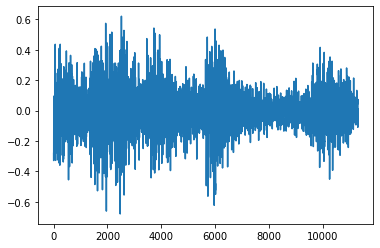

In [ ]:
win_length = 10000
hop_length = 5000
n_mels = 10
y_kernel = 1

mel_extractor_ = torchaudio.transforms.MelSpectrogram(hop_length=5000, 
                                                 n_mels=10, 
                                                 win_length=10000, 
                                                 n_fft=10000)

aed = conv2d_aed(extractor=mel_extractor_, kernel_size=(10, 1), stride=(128, 1))
y, sr = torchaudio.load('/content/Стрельба на улице.wav')
y = torch.unsqueeze(y, 0)
events = list(aed.get_events(y, tresh_hold=0.5))[0]
event, sr = events
plt.plot(event.flatten().numpy())
ipd.display(ipd.Audio(event.flatten(), rate=sr))

inference([(event[0], sr)], out_model, le, data.extractor, data.aggregator)

## deeplearning

In [ ]:
#@title WavDataset
class WavDataset(torch.utils.data.Dataset):
    def __init__(self, data_dir=None, fnames=None, wavs=None, labels=None, 
                 pad_size=False, le=None, extractor=None, aggregator=None, 
                 as_numpy=False):
        '''
        data_dir: str - path to dir with .wav files
        fnames: list - every item is name of .wav file in data_dir
        labels: list - labels for files in data_dir in the same order as fnames
        pad_size: 'mean', 'max', 'min' , False or int size for pad and cut if 
                  False do not use padding and truncutting
        le: function to encode labels for lerning
        extractor: function for feature extruction from .wav files
        aggregator: function for aggregation features and reducing dims
        as_numpy: False - using for torch.dataloader, True - for getting np.array
        '''
        super().__init__()
        self.extractor = extractor
        self.aggregator = aggregator
        self.as_numpy = as_numpy
        self.data_dir = data_dir
        self.fnames = fnames
        self.wavs = wavs
        self.labels = labels
        if le and (self.labels is not None):
            self.labels = le.transform(self.labels)
        len_sum = 0
        len_max = 0
        len_min = np.inf
        if self.fnames is not None:
            self.fnames = [os.path.join(self.data_dir, fname) for fname in self.fnames]
            l = self.fnames
        else:
            l = wavs
        for fname in tqdm.tqdm(l):
            if type(fname) is str:
                wav =  torchaudio.load(fname)[0][0]
            else:
                wav = l[0][0]
            len_sum += len(wav)
            if len_max < len(wav):
                len_max = len(wav)
            if len_min > len(wav):
                len_min = len(wav)
        self.len_mean = len_sum/len(l)
        self.len_max = len_max
        self.len_min = len_min
        if pad_size == 'mean':
            self.pad_size = int(self.len_mean)
        elif pad_size == 'max':
            self.pad_size = self.len_max
        elif pad_size == 'max':
            self.pad_size = self.len_min
        else:
            self.pad_size = pad_size

    def __len__(self):
        if self.fnames is not None:
            return len(self.fnames)
        else:
            return len(self.wavs)
    
    def __getitem__(self, idx):
        if self.fnames is not None:
            wav, sr =  torchaudio.load(self.fnames[idx])
        else:
            wav, sr =  self.wavs[idx]
        if self.labels is not None:
            labels = self.labels[idx]
        else:
            labels = []
        if self.pad_size:
            p = (self.pad_size - len(wav.flatten())) // 2 + 1
            if p>0:
                wav =torch.nn.functional.pad(wav, (p, p), value=0.0)
            wav = wav[:, :self.pad_size]
        if self.extractor is not None:
            wav = self.extractor(wav)
        if self.aggregator is not None:
            wav = self.aggregator(wav)
        if self.as_numpy:
            wav = wav.numpy()
            wav = np.append(wav, labels)
            return wav
        else:
            return wav, labels

    def numpy(self):
        self.as_numpy = True
        return np.array(self)

In [ ]:
data_dir = 'train'
train_csv = pd.read_csv('train.csv')
le = sklearn.preprocessing.LabelEncoder()
le.fit(train_csv['label'].values)
n_classes = len(le.classes_)
win_length = 1000
hop_length = 500
n_mels = 128
extractor = torchaudio.transforms.MelSpectrogram(hop_length=hop_length, 
                                                 n_mels=n_mels, 
                                                 win_length=win_length, 
                                                 n_fft=win_length)
extractor = torchaudio.transforms.MFCC(n_mfcc=40, 
                                            log_mels=True,
                                            melkwargs={'hop_length':hop_length, 
                                            'n_mels':n_mels, 
                                            'win_length':win_length, 
                                            'n_fft':win_length})
aggregator = lambda x: torch.mean(x, axis=-1)
data = WavDataset(data_dir=data_dir, fnames=train_csv['fname'], 
                   labels=train_csv['label'], pad_size='mean', le=le, 
                   extractor=extractor, aggregator=None, as_numpy=False)
train, test = torch.utils.data.random_split(data, [4683, 1000])
trainloader = torch.utils.data.DataLoader(train, batch_size=32, shuffle=True)
testloader = torch.utils.data.DataLoader(test, batch_size=32, shuffle=True)
data.pad_size


100%|██████████| 5683/5683 [00:09<00:00, 571.06it/s]


108929

In [ ]:
for x, y in trainloader:
    print(x.size())
    print(y.size())
    print(y)
    break

torch.Size([32, 1, 40, 218])
torch.Size([32])
tensor([ 2,  1, 31,  2, 30, 35, 20, 29, 25,  3, 38,  1, 32, 18, 25,  3, 17,  0,
        23, 33,  3, 11, 24, 10, 33, 20, 20, 34, 26, 36, 27, 21])


In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

class simpleconv(nn.Module):
    def __init__(self, y_kernel, n_mels, n_input=1, n_output=2, stride=16, n_channel=32, DR=0.3):
        super().__init__()
        self.conv1 = nn.Conv2d(n_input, n_channel, kernel_size=(n_mels, y_kernel), stride=(128, 1), padding=(0, y_kernel//2))
        self.bn1 = nn.BatchNorm2d(n_channel)
        self.pool1 = nn.MaxPool2d((1, 4))
        self.drop1 = nn.Dropout(DR)
        self.conv2 = nn.Conv2d(n_channel, n_channel, kernel_size=(1, 3))
        self.bn2 = nn.BatchNorm2d(n_channel)
        self.pool2 = nn.MaxPool2d((1, 4))
        self.drop2 = nn.Dropout(DR)
        self.conv3 = nn.Conv2d(n_channel, 2 * n_channel, kernel_size=(1, 3))
        self.bn3 = nn.BatchNorm2d(2 * n_channel)
        self.drop3 = nn.Dropout(DR)
        self.pool3 = nn.MaxPool2d((1, 4))
        self.conv4 = nn.Conv2d(2 * n_channel, 2 * n_channel, kernel_size=(1, 3))
        self.bn4 = nn.BatchNorm2d(2 * n_channel)
        self.pool4 = nn.MaxPool2d((1, 4))
        self.drop4 = nn.Dropout(DR)
        self.fc1 = nn.Linear(448, n_output)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(self.bn1(x))
        x = self.pool1(x)
        x = self.drop1(x)
        x = self.conv2(x)
        x = F.relu(self.bn2(x))
        x = self.pool2(x)
        x = self.drop2(x)
        x = self.conv3(x)
        x = F.relu(self.bn3(x))
        x = self.pool3(x)
        x = self.drop3(x)
        x = self.conv4(x)
        x = F.relu(self.bn4(x))
        x = self.pool4(x)
        x = torch.flatten(x, 1) #F.avg_pool2d(x, (1, x.shape[-1]))
        #x = x.permute(0, 2, 1)
        x = self.drop4(x)
        x = self.fc1(x)
        return F.log_softmax(x)

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
epochs = 50
model = simpleconv(y_kernel=5, n_mels=n_mels, n_output=n_classes)
model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.0001)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=epochs, gamma=0.1)

for e in range(epochs):
    model.train()
    losses = []
    for x, y in tqdm.tqdm(trainloader):
        x = x.to(device)
        y = y.to(device)
        output = model(x)
        loss = F.nll_loss(output.squeeze(), y)

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1)
        optimizer.step()
        
        losses.append(loss.item())
    print('loss:', sum(losses)/len(losses))
    y_preds = None
    y_trues = None
    model.eval()
    for x, y_true in tqdm.tqdm(testloader):
        x = x.to(device)
        out = model(x)
        y_pred = out.argmax(dim=-1).to('cpu').detach().numpy()
        if y_preds is not None:
            y_preds = np.concatenate([y_preds, y_pred])
            y_trues = np.concatenate([y_trues, y_true])
        else:
            y_preds = y_pred
            y_trues = y_true
    f1 = sklearn.metrics.f1_score(y_trues, y_preds, average='macro')
    acc = sklearn.metrics.accuracy_score(y_trues, y_preds)
    precision = sklearn.metrics.precision_score(y_trues, y_preds, average='macro')
    recall = sklearn.metrics.recall_score(y_trues, y_preds, average='macro')
    print('metrics:', acc, f1, precision, recall)
    
    scheduler.step()

100%|██████████| 147/147 [00:32<00:00,  4.51it/s]


loss: 3.582556119581469


100%|██████████| 32/32 [00:06<00:00,  4.81it/s]


metrics: 0.099 0.06664488236034534 0.09819674325554408 0.0901729943193358


100%|██████████| 147/147 [00:32<00:00,  4.51it/s]


loss: 3.1838223334072397


100%|██████████| 32/32 [00:06<00:00,  4.81it/s]


metrics: 0.151 0.10536734103090178 0.14229782720621073 0.1371322676200725


100%|██████████| 147/147 [00:32<00:00,  4.54it/s]


loss: 2.992970505539252


100%|██████████| 32/32 [00:06<00:00,  4.90it/s]


metrics: 0.192 0.14044827072893862 0.19029971929329126 0.17533216338094385


100%|██████████| 147/147 [00:33<00:00,  4.45it/s]


loss: 2.806674809682937


100%|██████████| 32/32 [00:06<00:00,  4.74it/s]


metrics: 0.099 0.07256253895927905 0.11086329721674938 0.09301131423082644


100%|██████████| 147/147 [00:33<00:00,  4.40it/s]


loss: 2.7275258164827516


100%|██████████| 32/32 [00:06<00:00,  4.75it/s]


metrics: 0.16 0.12517245309834188 0.2374264624944744 0.1495653312421605


100%|██████████| 147/147 [00:32<00:00,  4.47it/s]


loss: 2.6317205631814033


100%|██████████| 32/32 [00:06<00:00,  4.78it/s]


metrics: 0.155 0.14219343638436455 0.2848916721659682 0.15005939899393045


100%|██████████| 147/147 [00:32<00:00,  4.47it/s]


loss: 2.5831718720546384


100%|██████████| 32/32 [00:06<00:00,  4.68it/s]


metrics: 0.091 0.06608942999587462 0.12833334808189173 0.08642588569417838


100%|██████████| 147/147 [00:33<00:00,  4.43it/s]


loss: 2.526347656639255


100%|██████████| 32/32 [00:06<00:00,  4.76it/s]


metrics: 0.207 0.18567414332016455 0.3071143447130445 0.1896675596707689


100%|██████████| 147/147 [00:32<00:00,  4.48it/s]


loss: 2.4488316076953396


100%|██████████| 32/32 [00:06<00:00,  4.76it/s]


metrics: 0.141 0.11385364435122658 0.2217588184989449 0.13572678303101923


100%|██████████| 147/147 [00:32<00:00,  4.49it/s]


loss: 2.4391012094458757


100%|██████████| 32/32 [00:06<00:00,  4.74it/s]


metrics: 0.149 0.10291857058670036 0.17607753693776232 0.13072361581507924


100%|██████████| 147/147 [00:32<00:00,  4.47it/s]


loss: 2.3798050637147865


100%|██████████| 32/32 [00:06<00:00,  4.72it/s]


metrics: 0.169 0.14904837209275076 0.29495352406132697 0.16140123893172673


100%|██████████| 147/147 [00:33<00:00,  4.45it/s]


loss: 2.344458063443502


100%|██████████| 32/32 [00:06<00:00,  4.78it/s]


metrics: 0.162 0.12785876581693062 0.2053572431108837 0.14203838520911694


100%|██████████| 147/147 [00:32<00:00,  4.50it/s]


loss: 2.281342090392599


100%|██████████| 32/32 [00:06<00:00,  4.77it/s]


metrics: 0.167 0.12633399885641905 0.25735913020199264 0.1496044088422137


100%|██████████| 147/147 [00:32<00:00,  4.51it/s]


loss: 2.2599148725976748


100%|██████████| 32/32 [00:06<00:00,  4.77it/s]


metrics: 0.197 0.14307790039123305 0.23419825518320156 0.18495608468169444


100%|██████████| 147/147 [00:32<00:00,  4.48it/s]


loss: 2.218977894101824


100%|██████████| 32/32 [00:06<00:00,  4.77it/s]


metrics: 0.184 0.11632879156917215 0.15866302017388845 0.16806452708891734


100%|██████████| 147/147 [00:33<00:00,  4.45it/s]


loss: 2.195498011550125


100%|██████████| 32/32 [00:06<00:00,  4.71it/s]


metrics: 0.165 0.11482102700218182 0.18719796432868221 0.15711704638533908


100%|██████████| 147/147 [00:33<00:00,  4.45it/s]


loss: 2.172496677255955


100%|██████████| 32/32 [00:06<00:00,  4.77it/s]


metrics: 0.201 0.1645605818137372 0.27100159562000464 0.18409202579934286


100%|██████████| 147/147 [00:32<00:00,  4.46it/s]


loss: 2.157923702480031


100%|██████████| 32/32 [00:06<00:00,  4.76it/s]


metrics: 0.166 0.11606843086639668 0.21777974515810167 0.1541990468514859


100%|██████████| 147/147 [00:33<00:00,  4.45it/s]


loss: 2.1181438163835176


100%|██████████| 32/32 [00:06<00:00,  4.73it/s]


metrics: 0.143 0.11456435930201242 0.21802020954624174 0.1324980734431954


100%|██████████| 147/147 [00:32<00:00,  4.49it/s]


loss: 2.1011608076744337


100%|██████████| 32/32 [00:06<00:00,  4.79it/s]


metrics: 0.187 0.11790003560595129 0.2645099276265642 0.16704951921415334


100%|██████████| 147/147 [00:32<00:00,  4.51it/s]


loss: 2.0846037783590305


100%|██████████| 32/32 [00:06<00:00,  4.83it/s]


metrics: 0.164 0.12736691532097127 0.24056147441459344 0.14743500398988202


100%|██████████| 147/147 [00:32<00:00,  4.53it/s]


loss: 2.0553971537116436


100%|██████████| 32/32 [00:06<00:00,  4.89it/s]


metrics: 0.226 0.16697385632391562 0.31603997244105453 0.20645787423707834


100%|██████████| 147/147 [00:32<00:00,  4.55it/s]


loss: 2.03350923337093


100%|██████████| 32/32 [00:06<00:00,  4.87it/s]


metrics: 0.161 0.11759098263284846 0.2047405584278547 0.14777462920755605


100%|██████████| 147/147 [00:32<00:00,  4.59it/s]


loss: 2.016501618891346


100%|██████████| 32/32 [00:06<00:00,  4.91it/s]


metrics: 0.179 0.11151980289320539 0.2086285061474329 0.15910978520734617


100%|██████████| 147/147 [00:32<00:00,  4.56it/s]


loss: 1.9877349551843138


100%|██████████| 32/32 [00:06<00:00,  4.89it/s]


metrics: 0.181 0.11598903650111533 0.209759659854202 0.15800581337166703


100%|██████████| 147/147 [00:32<00:00,  4.50it/s]


loss: 1.9528876105133368


100%|██████████| 32/32 [00:06<00:00,  4.82it/s]


metrics: 0.18 0.13650392290630753 0.23946261386362452 0.15795219182414305


100%|██████████| 147/147 [00:32<00:00,  4.50it/s]


loss: 1.9471803806266006


100%|██████████| 32/32 [00:06<00:00,  4.78it/s]


metrics: 0.188 0.13070570077326482 0.19141535354373973 0.16638037272183615


100%|██████████| 147/147 [00:32<00:00,  4.49it/s]


loss: 1.9324090472694968


100%|██████████| 32/32 [00:06<00:00,  4.81it/s]


metrics: 0.219 0.19384997380082894 0.309571216757529 0.20858345654237825


100%|██████████| 147/147 [00:32<00:00,  4.53it/s]


loss: 1.9188305536905925


100%|██████████| 32/32 [00:06<00:00,  4.88it/s]


metrics: 0.195 0.12202344957244501 0.2023563320051888 0.17154019690605057


100%|██████████| 147/147 [00:32<00:00,  4.56it/s]


loss: 1.9187165450076669


100%|██████████| 32/32 [00:06<00:00,  4.79it/s]


metrics: 0.19 0.15661297178513123 0.30154977625365004 0.17712500102744003


100%|██████████| 147/147 [00:32<00:00,  4.48it/s]


loss: 1.9040470374684755


100%|██████████| 32/32 [00:06<00:00,  4.73it/s]


metrics: 0.201 0.13956571448428096 0.2282907228223438 0.1736457580055141


100%|██████████| 147/147 [00:33<00:00,  4.45it/s]


loss: 1.8804801410558272


100%|██████████| 32/32 [00:06<00:00,  4.74it/s]


metrics: 0.17 0.12697823628017194 0.19227329910474292 0.1506464508903533


100%|██████████| 147/147 [00:32<00:00,  4.47it/s]


loss: 1.8749130481765384


100%|██████████| 32/32 [00:06<00:00,  4.76it/s]


metrics: 0.203 0.143060973961427 0.23390863099592452 0.17807494267860122


100%|██████████| 147/147 [00:33<00:00,  4.37it/s]


loss: 1.8684000985152056


100%|██████████| 32/32 [00:06<00:00,  4.65it/s]


metrics: 0.182 0.13604415782759005 0.24047586951860314 0.16174646488670877


100%|██████████| 147/147 [00:33<00:00,  4.42it/s]


loss: 1.846721772433949


100%|██████████| 32/32 [00:06<00:00,  4.80it/s]


metrics: 0.233 0.18222405596339858 0.3004306658263104 0.20646056064059917


100%|██████████| 147/147 [00:32<00:00,  4.49it/s]


loss: 1.839996061357511


100%|██████████| 32/32 [00:06<00:00,  4.82it/s]


metrics: 0.192 0.15716941034329424 0.2702527010575805 0.18043474665586348


100%|██████████| 147/147 [00:32<00:00,  4.50it/s]


loss: 1.8506198756548824


100%|██████████| 32/32 [00:06<00:00,  4.78it/s]


metrics: 0.223 0.17637015320639304 0.33951245550971787 0.2048822454936062


100%|██████████| 147/147 [00:32<00:00,  4.49it/s]


loss: 1.827230223993055


100%|██████████| 32/32 [00:06<00:00,  4.80it/s]


metrics: 0.228 0.183367531620606 0.28847969322417727 0.20552369221977698


100%|██████████| 147/147 [00:32<00:00,  4.50it/s]


loss: 1.8084171629276404


100%|██████████| 32/32 [00:06<00:00,  4.75it/s]


metrics: 0.195 0.15357409057823887 0.2471935983104171 0.17804618085266352


100%|██████████| 147/147 [00:32<00:00,  4.48it/s]


loss: 1.8120804279028964


100%|██████████| 32/32 [00:06<00:00,  4.75it/s]


metrics: 0.212 0.15268024106856093 0.2258138594672745 0.1879027385734703


100%|██████████| 147/147 [00:32<00:00,  4.47it/s]


loss: 1.787281176670879


100%|██████████| 32/32 [00:06<00:00,  4.69it/s]


metrics: 0.197 0.14489412900621446 0.25687964322066836 0.17264965478380112


100%|██████████| 147/147 [00:33<00:00,  4.44it/s]


loss: 1.782827353801857


100%|██████████| 32/32 [00:06<00:00,  4.71it/s]


metrics: 0.203 0.15628069730629723 0.29288570466490155 0.18205726379827794


100%|██████████| 147/147 [00:32<00:00,  4.49it/s]


loss: 1.7857724890416982


100%|██████████| 32/32 [00:06<00:00,  4.79it/s]


metrics: 0.264 0.250646569167903 0.3825981450064927 0.24996872079831


100%|██████████| 147/147 [00:32<00:00,  4.51it/s]


loss: 1.7707883581823232


100%|██████████| 32/32 [00:06<00:00,  4.77it/s]


metrics: 0.192 0.1549445072499019 0.2797196282296863 0.16742939037226587


100%|██████████| 147/147 [00:32<00:00,  4.51it/s]


loss: 1.7584139327613675


100%|██████████| 32/32 [00:06<00:00,  4.81it/s]


metrics: 0.192 0.1375912513874446 0.3084868812668904 0.17106681132676


100%|██████████| 147/147 [00:33<00:00,  4.44it/s]


loss: 1.7766588447856255


100%|██████████| 32/32 [00:06<00:00,  4.71it/s]


metrics: 0.181 0.1383949476021307 0.2873447688243728 0.15997585018926483


100%|██████████| 147/147 [00:33<00:00,  4.44it/s]


loss: 1.739557443021917


100%|██████████| 32/32 [00:06<00:00,  4.68it/s]


metrics: 0.204 0.15524915541047118 0.28587010034164445 0.18228090786017617


100%|██████████| 147/147 [00:32<00:00,  4.46it/s]


loss: 1.7258725028459718


100%|██████████| 32/32 [00:06<00:00,  4.73it/s]


metrics: 0.223 0.17974118354396093 0.31083745768294363 0.20377436228045984


100%|██████████| 147/147 [00:32<00:00,  4.48it/s]


loss: 1.7378124663618957


100%|██████████| 32/32 [00:06<00:00,  4.83it/s]


metrics: 0.242 0.20346918349739426 0.2986104008063723 0.22822774563788684


100%|██████████| 147/147 [00:32<00:00,  4.50it/s]


loss: 1.7170469185122017


100%|██████████| 32/32 [00:06<00:00,  4.79it/s]

metrics: 0.21 0.16848991378112396 0.2884454508256935 0.18898520624130383


In [ ]:
#!pip install pytorch-lightning
import pytorch_lightning as pl
import torchmetrics
from torch import nn
from torch.nn import functional as F

In [ ]:
n_mels, y_kernel

NameError: ignored

In [ ]:
class pl_cnn2d(pl.LightningModule):
    def __init__(self, y_kernel, n_mels, n_input=1, n_output=2, stride=16, n_channel=32, DR=0.2):
        super().__init__()
        self.conv1 = nn.Conv2d(n_input, n_channel, kernel_size=(n_mels, y_kernel), stride=(128, 1), padding=(0, y_kernel//2))
        self.bn1 = nn.BatchNorm2d(n_channel)
        self.pool1 = nn.MaxPool2d((1, 4))
        self.drop1 = nn.Dropout(DR)

        self.conv2 = nn.Conv2d(n_channel, n_channel, kernel_size=(1, 3))
        self.bn2 = nn.BatchNorm2d(n_channel)
        self.pool2 = nn.MaxPool2d((1, 4))
        self.drop2 = nn.Dropout(DR)

        self.conv3 = nn.Conv2d(n_channel, 2 * n_channel, kernel_size=(1, 3))
        self.bn3 = nn.BatchNorm2d(2 * n_channel)
        self.pool3 = nn.MaxPool2d((1, 4))
        self.drop3 = nn.Dropout(DR)

        self.drop4 = nn.Dropout(DR)
        self.fc4 = nn.Linear(128, n_output)

        #metrics
        self.f1_train = torchmetrics.F1Score(num_classes=n_output)
        self.f1_val = torchmetrics.F1Score(num_classes=n_output)
        self.loss = torch.nn.CrossEntropyLoss()

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(self.bn1(x))
        x = self.pool1(x)
        x = self.drop1(x)

        x = self.conv2(x)
        x = F.relu(self.bn2(x))
        x = self.pool2(x)
        x = self.drop2(x)

        x = self.conv3(x)
        x = F.relu(self.bn3(x))
        x = self.pool3(x)
        x = self.drop3(x)
        
        x = torch.flatten(x, 1)
        x = self.drop4(x)
        x = self.fc4(x)
        return F.log_softmax(x)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-2)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x, y = train_batch
        y_pred = self(x)    

        loss = self.loss(y_pred, y)
        self.log('train_loss', loss)
        self.f1_train(y_pred, y)
        #mask = y_pred.argmax()
        #self.acc_train(mask.type(torch.ByteTensor), y.type(torch.ByteTensor))
        return loss

    def training_epoch_end(self, outs):
        f1 = self.f1_train.compute()
        #acc = self.acc_train.compute()
        self.log('train_f1_epoch', f1)
        print('train_f1', f1)

    def validation_step(self, val_batch, batch_idx):
        x, y = val_batch
        x.to('cuda'), y.to('cuda')
        y_pred = self(x)
        loss = self.loss(y_pred, y)
        self.f1_val(y_pred, y)
        #self.acc_val(mask.type(torch.ByteTensor), y.type(torch.ByteTensor))
        self.log('val_loss', loss)

    def validation_epoch_end(self, outs):
        f1 = self.f1_val.compute()
        #acc = self.acc_val.compute()
        self.log('val_f1_epoch', f1)
        print('val_f1', f1)

In [ ]:
model = pl_cnn2d(y_kernel=5, n_mels=40, n_output=n_classes)

trainer = pl.Trainer(accelerator="gpu", devices=1)
trainer.fit(model, trainloader, testloader)

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
  category=PossibleUserWarning,
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name     | Type             | Params
-----------------------------------------------
0  | conv1    | Conv2d           | 6.4 K 
1  | bn1      | BatchNorm2d      | 64    
2  | pool1    | MaxPool2d        | 0     
3  | drop1    | Dropout          | 0     
4  | conv2    | Conv2d           | 3.1 K 
5  | bn2      | BatchNorm2d      | 64    
6  | pool2    | MaxPool2d        | 0     
7  | drop2    | Dropout          | 0     
8  | conv3    | Conv2d           | 6.2 K 
9  | bn3      | BatchNorm2d      | 128   
10 | pool3    | MaxPool2d        | 0     
11 | drop3    | Drop

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:489: PossibleUserWarning: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test/predict dataloaders.
  category=PossibleUserWarning,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.


val_f1 tensor(0.0156, device='cuda:0')


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.2378, device='cuda:0')
train_f1 tensor(0.1732, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.2742, device='cuda:0')
train_f1 tensor(0.2208, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.3087, device='cuda:0')
train_f1 tensor(0.2508, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.3297, device='cuda:0')
train_f1 tensor(0.2768, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.3432, device='cuda:0')
train_f1 tensor(0.2933, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.3569, device='cuda:0')
train_f1 tensor(0.3072, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.3710, device='cuda:0')
train_f1 tensor(0.3199, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.3787, device='cuda:0')
train_f1 tensor(0.3299, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.3869, device='cuda:0')
train_f1 tensor(0.3403, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.3947, device='cuda:0')
train_f1 tensor(0.3493, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4011, device='cuda:0')
train_f1 tensor(0.3574, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4055, device='cuda:0')
train_f1 tensor(0.3645, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4088, device='cuda:0')
train_f1 tensor(0.3718, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4138, device='cuda:0')
train_f1 tensor(0.3784, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4182, device='cuda:0')
train_f1 tensor(0.3842, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4220, device='cuda:0')
train_f1 tensor(0.3901, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4262, device='cuda:0')
train_f1 tensor(0.3955, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4295, device='cuda:0')
train_f1 tensor(0.4004, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4330, device='cuda:0')
train_f1 tensor(0.4052, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4366, device='cuda:0')
train_f1 tensor(0.4096, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4385, device='cuda:0')
train_f1 tensor(0.4135, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4417, device='cuda:0')
train_f1 tensor(0.4174, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4449, device='cuda:0')
train_f1 tensor(0.4208, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4469, device='cuda:0')
train_f1 tensor(0.4243, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4494, device='cuda:0')
train_f1 tensor(0.4271, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4518, device='cuda:0')
train_f1 tensor(0.4304, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4543, device='cuda:0')
train_f1 tensor(0.4335, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4568, device='cuda:0')
train_f1 tensor(0.4366, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4590, device='cuda:0')
train_f1 tensor(0.4393, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4613, device='cuda:0')
train_f1 tensor(0.4420, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4631, device='cuda:0')
train_f1 tensor(0.4447, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4650, device='cuda:0')
train_f1 tensor(0.4471, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4670, device='cuda:0')
train_f1 tensor(0.4495, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4689, device='cuda:0')
train_f1 tensor(0.4519, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4709, device='cuda:0')
train_f1 tensor(0.4538, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4727, device='cuda:0')
train_f1 tensor(0.4561, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4741, device='cuda:0')
train_f1 tensor(0.4582, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4756, device='cuda:0')
train_f1 tensor(0.4599, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4771, device='cuda:0')
train_f1 tensor(0.4619, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4786, device='cuda:0')
train_f1 tensor(0.4636, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4802, device='cuda:0')
train_f1 tensor(0.4656, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4813, device='cuda:0')
train_f1 tensor(0.4675, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4825, device='cuda:0')
train_f1 tensor(0.4689, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4839, device='cuda:0')
train_f1 tensor(0.4709, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4848, device='cuda:0')
train_f1 tensor(0.4726, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4860, device='cuda:0')
train_f1 tensor(0.4740, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4871, device='cuda:0')
train_f1 tensor(0.4757, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4879, device='cuda:0')
train_f1 tensor(0.4772, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4890, device='cuda:0')
train_f1 tensor(0.4786, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4899, device='cuda:0')
train_f1 tensor(0.4799, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4906, device='cuda:0')
train_f1 tensor(0.4815, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4916, device='cuda:0')
train_f1 tensor(0.4830, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4925, device='cuda:0')
train_f1 tensor(0.4846, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4935, device='cuda:0')
train_f1 tensor(0.4860, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4943, device='cuda:0')
train_f1 tensor(0.4872, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4952, device='cuda:0')
train_f1 tensor(0.4884, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4963, device='cuda:0')
train_f1 tensor(0.4897, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4972, device='cuda:0')
train_f1 tensor(0.4911, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4980, device='cuda:0')
train_f1 tensor(0.4922, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4988, device='cuda:0')
train_f1 tensor(0.4934, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.4998, device='cuda:0')
train_f1 tensor(0.4946, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5006, device='cuda:0')
train_f1 tensor(0.4956, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5015, device='cuda:0')
train_f1 tensor(0.4967, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5025, device='cuda:0')
train_f1 tensor(0.4978, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5032, device='cuda:0')
train_f1 tensor(0.4989, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5040, device='cuda:0')
train_f1 tensor(0.4999, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5047, device='cuda:0')
train_f1 tensor(0.5009, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5056, device='cuda:0')
train_f1 tensor(0.5019, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5066, device='cuda:0')
train_f1 tensor(0.5027, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5073, device='cuda:0')
train_f1 tensor(0.5037, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5081, device='cuda:0')
train_f1 tensor(0.5046, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5089, device='cuda:0')
train_f1 tensor(0.5055, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5094, device='cuda:0')
train_f1 tensor(0.5065, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5101, device='cuda:0')
train_f1 tensor(0.5075, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5109, device='cuda:0')
train_f1 tensor(0.5082, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5114, device='cuda:0')
train_f1 tensor(0.5091, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5122, device='cuda:0')
train_f1 tensor(0.5099, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5130, device='cuda:0')
train_f1 tensor(0.5107, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5138, device='cuda:0')
train_f1 tensor(0.5115, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5144, device='cuda:0')
train_f1 tensor(0.5124, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5150, device='cuda:0')
train_f1 tensor(0.5132, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5157, device='cuda:0')
train_f1 tensor(0.5141, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5164, device='cuda:0')
train_f1 tensor(0.5149, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5168, device='cuda:0')
train_f1 tensor(0.5156, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5176, device='cuda:0')
train_f1 tensor(0.5164, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5181, device='cuda:0')
train_f1 tensor(0.5171, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5188, device='cuda:0')
train_f1 tensor(0.5179, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5196, device='cuda:0')
train_f1 tensor(0.5188, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5201, device='cuda:0')
train_f1 tensor(0.5194, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5207, device='cuda:0')
train_f1 tensor(0.5201, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5212, device='cuda:0')
train_f1 tensor(0.5207, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5219, device='cuda:0')
train_f1 tensor(0.5215, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5224, device='cuda:0')
train_f1 tensor(0.5222, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5228, device='cuda:0')
train_f1 tensor(0.5229, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5233, device='cuda:0')
train_f1 tensor(0.5235, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5237, device='cuda:0')
train_f1 tensor(0.5241, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5243, device='cuda:0')
train_f1 tensor(0.5248, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5248, device='cuda:0')
train_f1 tensor(0.5254, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5254, device='cuda:0')
train_f1 tensor(0.5259, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5259, device='cuda:0')
train_f1 tensor(0.5265, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5263, device='cuda:0')
train_f1 tensor(0.5272, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5267, device='cuda:0')
train_f1 tensor(0.5278, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5274, device='cuda:0')
train_f1 tensor(0.5285, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5278, device='cuda:0')
train_f1 tensor(0.5291, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5281, device='cuda:0')
train_f1 tensor(0.5297, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5286, device='cuda:0')
train_f1 tensor(0.5303, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5290, device='cuda:0')
train_f1 tensor(0.5308, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5294, device='cuda:0')
train_f1 tensor(0.5314, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5297, device='cuda:0')
train_f1 tensor(0.5321, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5301, device='cuda:0')
train_f1 tensor(0.5326, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5305, device='cuda:0')
train_f1 tensor(0.5331, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5309, device='cuda:0')
train_f1 tensor(0.5335, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5314, device='cuda:0')
train_f1 tensor(0.5341, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5319, device='cuda:0')
train_f1 tensor(0.5347, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5324, device='cuda:0')
train_f1 tensor(0.5352, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5329, device='cuda:0')
train_f1 tensor(0.5358, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5333, device='cuda:0')
train_f1 tensor(0.5363, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5336, device='cuda:0')
train_f1 tensor(0.5368, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5339, device='cuda:0')
train_f1 tensor(0.5374, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5342, device='cuda:0')
train_f1 tensor(0.5378, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5347, device='cuda:0')
train_f1 tensor(0.5383, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5350, device='cuda:0')
train_f1 tensor(0.5388, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5353, device='cuda:0')
train_f1 tensor(0.5393, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5356, device='cuda:0')
train_f1 tensor(0.5398, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5360, device='cuda:0')
train_f1 tensor(0.5403, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5364, device='cuda:0')
train_f1 tensor(0.5409, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5367, device='cuda:0')
train_f1 tensor(0.5413, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5370, device='cuda:0')
train_f1 tensor(0.5418, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5372, device='cuda:0')
train_f1 tensor(0.5422, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5376, device='cuda:0')
train_f1 tensor(0.5427, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5379, device='cuda:0')
train_f1 tensor(0.5431, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5381, device='cuda:0')
train_f1 tensor(0.5436, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5385, device='cuda:0')
train_f1 tensor(0.5440, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5388, device='cuda:0')
train_f1 tensor(0.5444, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5391, device='cuda:0')
train_f1 tensor(0.5448, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5394, device='cuda:0')
train_f1 tensor(0.5452, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5398, device='cuda:0')
train_f1 tensor(0.5456, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5399, device='cuda:0')
train_f1 tensor(0.5460, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5400, device='cuda:0')
train_f1 tensor(0.5464, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5402, device='cuda:0')
train_f1 tensor(0.5468, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5404, device='cuda:0')
train_f1 tensor(0.5471, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5408, device='cuda:0')
train_f1 tensor(0.5475, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5411, device='cuda:0')
train_f1 tensor(0.5479, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5412, device='cuda:0')
train_f1 tensor(0.5483, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5415, device='cuda:0')
train_f1 tensor(0.5488, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5417, device='cuda:0')
train_f1 tensor(0.5491, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5420, device='cuda:0')
train_f1 tensor(0.5495, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5422, device='cuda:0')
train_f1 tensor(0.5498, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5425, device='cuda:0')
train_f1 tensor(0.5502, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5427, device='cuda:0')
train_f1 tensor(0.5505, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5430, device='cuda:0')
train_f1 tensor(0.5509, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5432, device='cuda:0')
train_f1 tensor(0.5514, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5433, device='cuda:0')
train_f1 tensor(0.5517, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5434, device='cuda:0')
train_f1 tensor(0.5521, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5437, device='cuda:0')
train_f1 tensor(0.5524, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5439, device='cuda:0')
train_f1 tensor(0.5528, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5441, device='cuda:0')
train_f1 tensor(0.5532, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5443, device='cuda:0')
train_f1 tensor(0.5535, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5444, device='cuda:0')
train_f1 tensor(0.5538, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5445, device='cuda:0')
train_f1 tensor(0.5541, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5448, device='cuda:0')
train_f1 tensor(0.5545, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5449, device='cuda:0')
train_f1 tensor(0.5548, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5451, device='cuda:0')
train_f1 tensor(0.5552, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5453, device='cuda:0')
train_f1 tensor(0.5555, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5456, device='cuda:0')
train_f1 tensor(0.5558, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5457, device='cuda:0')
train_f1 tensor(0.5561, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5460, device='cuda:0')
train_f1 tensor(0.5565, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5462, device='cuda:0')
train_f1 tensor(0.5569, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5464, device='cuda:0')
train_f1 tensor(0.5571, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5466, device='cuda:0')
train_f1 tensor(0.5575, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5468, device='cuda:0')
train_f1 tensor(0.5578, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5471, device='cuda:0')
train_f1 tensor(0.5582, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5472, device='cuda:0')
train_f1 tensor(0.5585, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5474, device='cuda:0')
train_f1 tensor(0.5588, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5476, device='cuda:0')
train_f1 tensor(0.5591, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5478, device='cuda:0')
train_f1 tensor(0.5594, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5480, device='cuda:0')
train_f1 tensor(0.5597, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5482, device='cuda:0')
train_f1 tensor(0.5600, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5484, device='cuda:0')
train_f1 tensor(0.5602, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5485, device='cuda:0')
train_f1 tensor(0.5605, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5488, device='cuda:0')
train_f1 tensor(0.5608, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5489, device='cuda:0')
train_f1 tensor(0.5611, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5491, device='cuda:0')
train_f1 tensor(0.5614, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5492, device='cuda:0')
train_f1 tensor(0.5616, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5493, device='cuda:0')
train_f1 tensor(0.5619, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5494, device='cuda:0')
train_f1 tensor(0.5622, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5496, device='cuda:0')
train_f1 tensor(0.5625, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5498, device='cuda:0')
train_f1 tensor(0.5627, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5499, device='cuda:0')
train_f1 tensor(0.5630, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5502, device='cuda:0')
train_f1 tensor(0.5633, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5503, device='cuda:0')
train_f1 tensor(0.5636, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5504, device='cuda:0')
train_f1 tensor(0.5639, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5505, device='cuda:0')
train_f1 tensor(0.5642, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5507, device='cuda:0')
train_f1 tensor(0.5644, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5508, device='cuda:0')
train_f1 tensor(0.5647, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5511, device='cuda:0')
train_f1 tensor(0.5649, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5512, device='cuda:0')
train_f1 tensor(0.5652, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5514, device='cuda:0')
train_f1 tensor(0.5654, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5516, device='cuda:0')
train_f1 tensor(0.5657, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5518, device='cuda:0')
train_f1 tensor(0.5660, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5519, device='cuda:0')
train_f1 tensor(0.5663, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5520, device='cuda:0')
train_f1 tensor(0.5665, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5522, device='cuda:0')
train_f1 tensor(0.5668, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5523, device='cuda:0')
train_f1 tensor(0.5670, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5524, device='cuda:0')
train_f1 tensor(0.5673, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5526, device='cuda:0')
train_f1 tensor(0.5675, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5529, device='cuda:0')
train_f1 tensor(0.5678, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5530, device='cuda:0')
train_f1 tensor(0.5680, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5532, device='cuda:0')
train_f1 tensor(0.5683, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5534, device='cuda:0')
train_f1 tensor(0.5685, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5534, device='cuda:0')
train_f1 tensor(0.5688, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5535, device='cuda:0')
train_f1 tensor(0.5691, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5536, device='cuda:0')
train_f1 tensor(0.5693, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5537, device='cuda:0')
train_f1 tensor(0.5695, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5538, device='cuda:0')
train_f1 tensor(0.5698, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5539, device='cuda:0')
train_f1 tensor(0.5699, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5540, device='cuda:0')
train_f1 tensor(0.5701, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5540, device='cuda:0')
train_f1 tensor(0.5703, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5541, device='cuda:0')
train_f1 tensor(0.5705, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5543, device='cuda:0')
train_f1 tensor(0.5707, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5545, device='cuda:0')
train_f1 tensor(0.5710, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5547, device='cuda:0')
train_f1 tensor(0.5712, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5548, device='cuda:0')
train_f1 tensor(0.5714, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5550, device='cuda:0')
train_f1 tensor(0.5716, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5551, device='cuda:0')
train_f1 tensor(0.5719, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5552, device='cuda:0')
train_f1 tensor(0.5721, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5554, device='cuda:0')
train_f1 tensor(0.5723, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5555, device='cuda:0')
train_f1 tensor(0.5726, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5557, device='cuda:0')
train_f1 tensor(0.5728, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5558, device='cuda:0')
train_f1 tensor(0.5731, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5560, device='cuda:0')
train_f1 tensor(0.5734, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5562, device='cuda:0')
train_f1 tensor(0.5736, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5563, device='cuda:0')
train_f1 tensor(0.5738, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5564, device='cuda:0')
train_f1 tensor(0.5740, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5565, device='cuda:0')
train_f1 tensor(0.5743, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5567, device='cuda:0')
train_f1 tensor(0.5745, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5568, device='cuda:0')
train_f1 tensor(0.5746, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5569, device='cuda:0')
train_f1 tensor(0.5748, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5570, device='cuda:0')
train_f1 tensor(0.5750, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5571, device='cuda:0')
train_f1 tensor(0.5752, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5572, device='cuda:0')
train_f1 tensor(0.5754, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5573, device='cuda:0')
train_f1 tensor(0.5756, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5574, device='cuda:0')
train_f1 tensor(0.5758, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5575, device='cuda:0')
train_f1 tensor(0.5760, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5576, device='cuda:0')
train_f1 tensor(0.5762, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5577, device='cuda:0')
train_f1 tensor(0.5764, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5578, device='cuda:0')
train_f1 tensor(0.5767, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5579, device='cuda:0')
train_f1 tensor(0.5769, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5580, device='cuda:0')
train_f1 tensor(0.5771, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5581, device='cuda:0')
train_f1 tensor(0.5773, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5582, device='cuda:0')
train_f1 tensor(0.5775, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5583, device='cuda:0')
train_f1 tensor(0.5777, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5585, device='cuda:0')
train_f1 tensor(0.5779, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5586, device='cuda:0')
train_f1 tensor(0.5781, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5587, device='cuda:0')
train_f1 tensor(0.5783, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5588, device='cuda:0')
train_f1 tensor(0.5785, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5589, device='cuda:0')
train_f1 tensor(0.5787, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5590, device='cuda:0')
train_f1 tensor(0.5789, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5591, device='cuda:0')
train_f1 tensor(0.5791, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5592, device='cuda:0')
train_f1 tensor(0.5793, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5592, device='cuda:0')
train_f1 tensor(0.5794, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5593, device='cuda:0')
train_f1 tensor(0.5796, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5594, device='cuda:0')
train_f1 tensor(0.5798, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5595, device='cuda:0')
train_f1 tensor(0.5799, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5597, device='cuda:0')
train_f1 tensor(0.5802, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5597, device='cuda:0')
train_f1 tensor(0.5803, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5598, device='cuda:0')
train_f1 tensor(0.5805, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5598, device='cuda:0')
train_f1 tensor(0.5807, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5600, device='cuda:0')
train_f1 tensor(0.5808, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5601, device='cuda:0')
train_f1 tensor(0.5810, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5602, device='cuda:0')
train_f1 tensor(0.5812, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5603, device='cuda:0')
train_f1 tensor(0.5814, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5604, device='cuda:0')
train_f1 tensor(0.5815, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5606, device='cuda:0')
train_f1 tensor(0.5817, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5608, device='cuda:0')
train_f1 tensor(0.5818, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5609, device='cuda:0')
train_f1 tensor(0.5820, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5609, device='cuda:0')
train_f1 tensor(0.5823, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5610, device='cuda:0')
train_f1 tensor(0.5824, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5611, device='cuda:0')
train_f1 tensor(0.5827, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5611, device='cuda:0')
train_f1 tensor(0.5828, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5613, device='cuda:0')
train_f1 tensor(0.5830, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5614, device='cuda:0')
train_f1 tensor(0.5832, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5614, device='cuda:0')
train_f1 tensor(0.5834, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5615, device='cuda:0')
train_f1 tensor(0.5835, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5616, device='cuda:0')
train_f1 tensor(0.5837, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5617, device='cuda:0')
train_f1 tensor(0.5839, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5618, device='cuda:0')
train_f1 tensor(0.5840, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5619, device='cuda:0')
train_f1 tensor(0.5842, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5620, device='cuda:0')
train_f1 tensor(0.5843, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5620, device='cuda:0')
train_f1 tensor(0.5845, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5621, device='cuda:0')
train_f1 tensor(0.5847, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5622, device='cuda:0')
train_f1 tensor(0.5849, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5622, device='cuda:0')
train_f1 tensor(0.5850, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5623, device='cuda:0')
train_f1 tensor(0.5852, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5624, device='cuda:0')
train_f1 tensor(0.5853, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5625, device='cuda:0')
train_f1 tensor(0.5855, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5626, device='cuda:0')
train_f1 tensor(0.5857, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5626, device='cuda:0')
train_f1 tensor(0.5858, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5627, device='cuda:0')
train_f1 tensor(0.5860, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5628, device='cuda:0')
train_f1 tensor(0.5861, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5629, device='cuda:0')
train_f1 tensor(0.5863, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5630, device='cuda:0')
train_f1 tensor(0.5864, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5630, device='cuda:0')
train_f1 tensor(0.5866, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5631, device='cuda:0')
train_f1 tensor(0.5868, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5632, device='cuda:0')
train_f1 tensor(0.5869, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5632, device='cuda:0')
train_f1 tensor(0.5871, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5633, device='cuda:0')
train_f1 tensor(0.5872, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5633, device='cuda:0')
train_f1 tensor(0.5874, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5634, device='cuda:0')
train_f1 tensor(0.5875, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5635, device='cuda:0')
train_f1 tensor(0.5877, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5635, device='cuda:0')
train_f1 tensor(0.5878, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5636, device='cuda:0')
train_f1 tensor(0.5880, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5637, device='cuda:0')
train_f1 tensor(0.5881, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5637, device='cuda:0')
train_f1 tensor(0.5883, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5638, device='cuda:0')
train_f1 tensor(0.5884, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5639, device='cuda:0')
train_f1 tensor(0.5886, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5640, device='cuda:0')
train_f1 tensor(0.5887, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5641, device='cuda:0')
train_f1 tensor(0.5888, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5642, device='cuda:0')
train_f1 tensor(0.5890, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5643, device='cuda:0')
train_f1 tensor(0.5892, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5644, device='cuda:0')
train_f1 tensor(0.5893, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5645, device='cuda:0')
train_f1 tensor(0.5895, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5646, device='cuda:0')
train_f1 tensor(0.5896, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5647, device='cuda:0')
train_f1 tensor(0.5898, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5647, device='cuda:0')
train_f1 tensor(0.5899, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5648, device='cuda:0')
train_f1 tensor(0.5900, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5649, device='cuda:0')
train_f1 tensor(0.5902, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5649, device='cuda:0')
train_f1 tensor(0.5903, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5650, device='cuda:0')
train_f1 tensor(0.5905, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5651, device='cuda:0')
train_f1 tensor(0.5906, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5651, device='cuda:0')
train_f1 tensor(0.5908, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5652, device='cuda:0')
train_f1 tensor(0.5909, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5653, device='cuda:0')
train_f1 tensor(0.5911, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5653, device='cuda:0')
train_f1 tensor(0.5912, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5654, device='cuda:0')
train_f1 tensor(0.5913, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5654, device='cuda:0')
train_f1 tensor(0.5915, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5655, device='cuda:0')
train_f1 tensor(0.5916, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5655, device='cuda:0')
train_f1 tensor(0.5918, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5656, device='cuda:0')
train_f1 tensor(0.5919, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5656, device='cuda:0')
train_f1 tensor(0.5920, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5657, device='cuda:0')
train_f1 tensor(0.5922, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5657, device='cuda:0')
train_f1 tensor(0.5923, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5658, device='cuda:0')
train_f1 tensor(0.5924, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5658, device='cuda:0')
train_f1 tensor(0.5926, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5658, device='cuda:0')
train_f1 tensor(0.5927, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5659, device='cuda:0')
train_f1 tensor(0.5928, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5659, device='cuda:0')
train_f1 tensor(0.5930, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5660, device='cuda:0')
train_f1 tensor(0.5931, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5660, device='cuda:0')
train_f1 tensor(0.5932, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5660, device='cuda:0')
train_f1 tensor(0.5933, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5661, device='cuda:0')
train_f1 tensor(0.5935, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5662, device='cuda:0')
train_f1 tensor(0.5937, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5662, device='cuda:0')
train_f1 tensor(0.5938, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5663, device='cuda:0')
train_f1 tensor(0.5939, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5663, device='cuda:0')
train_f1 tensor(0.5940, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5664, device='cuda:0')
train_f1 tensor(0.5941, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5665, device='cuda:0')
train_f1 tensor(0.5943, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5665, device='cuda:0')
train_f1 tensor(0.5944, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5666, device='cuda:0')
train_f1 tensor(0.5946, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5667, device='cuda:0')
train_f1 tensor(0.5947, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5667, device='cuda:0')
train_f1 tensor(0.5948, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5667, device='cuda:0')
train_f1 tensor(0.5949, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5667, device='cuda:0')
train_f1 tensor(0.5950, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5668, device='cuda:0')
train_f1 tensor(0.5952, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5668, device='cuda:0')
train_f1 tensor(0.5953, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5669, device='cuda:0')
train_f1 tensor(0.5954, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5670, device='cuda:0')
train_f1 tensor(0.5955, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5671, device='cuda:0')
train_f1 tensor(0.5957, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5671, device='cuda:0')
train_f1 tensor(0.5958, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5671, device='cuda:0')
train_f1 tensor(0.5959, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5672, device='cuda:0')
train_f1 tensor(0.5961, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5672, device='cuda:0')
train_f1 tensor(0.5962, device='cuda:0')


Validation: 0it [00:00, ?it/s]

val_f1 tensor(0.5673, device='cuda:0')
train_f1 tensor(0.5964, device='cuda:0')


In [ ]:
%load_ext tensorboard
%tensorboard --logdir lightning_logs